<a href="https://colab.research.google.com/github/drumilbhati/ECE501_2025_Project12_Group2/blob/main/Final_Project_G2_ECE501.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using Colab cache for faster access to the 'casia-20-image-tampering-detection-dataset' dataset.
Dataset downloaded/found at: /kaggle/input/casia-20-image-tampering-detection-dataset
Input is a directory. Using it directly.
Using dataset root directory: /kaggle/input/casia-20-image-tampering-detection-dataset
Found Tampered images directory: /kaggle/input/casia-20-image-tampering-detection-dataset/CASIA2/Tp
Found 5123 candidate *forged* images.
Processing a subset of 20 images.
Processing [1/20]: Tp_D_NRN_M_N_nat00025_nat00028_11037.jpg
Processing [2/20]: Tp_S_NRN_S_N_art00092_art00092_11809.jpg
Processing [3/20]: Tp_D_NNN_M_N_arc00065_nat00095_11455.jpg
Processing [4/20]: Tp_D_NND_S_N_txt00062_txt00083_10824.jpg
Processing [5/20]: Tp_S_NRN_S_N_cha00036_cha00036_11736.jpg
Processing [6/20]: Tp_D_NNN_S_O_arc00062_arc00060_11494.jpg
Processing [7/20]: Tp_S_NRN_M_N_cha10114_nat10114_12181.jpg
Processing [8/20]: Tp_D_NRN_S_N_pla00010_pla00008_10935.jpg
Processing [9/20]: Tp_S_NNN_S_N_cha10

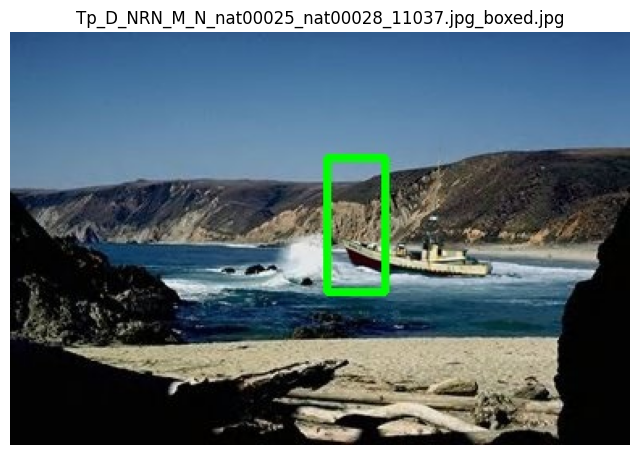

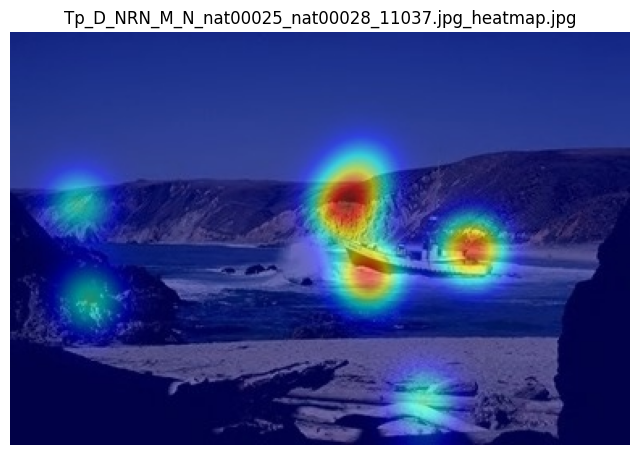

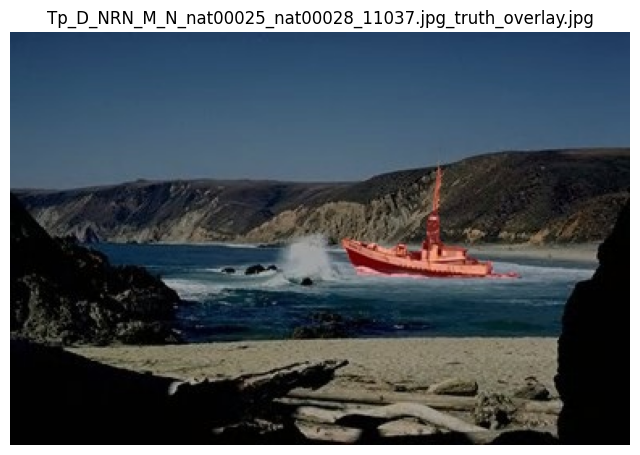

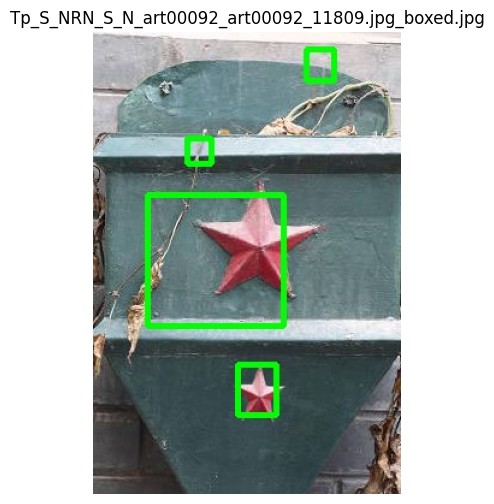

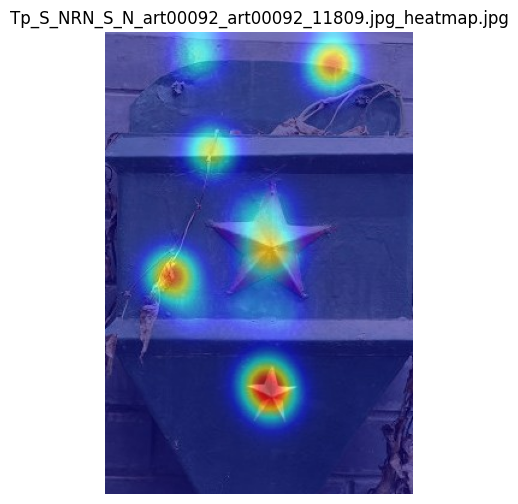

...

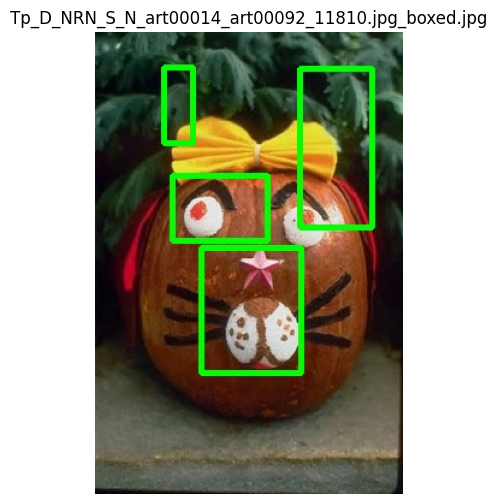

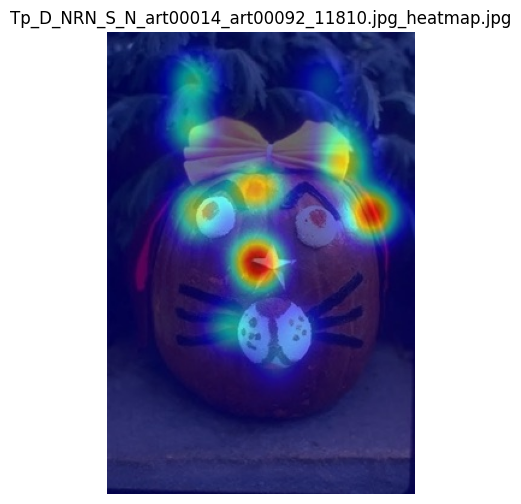

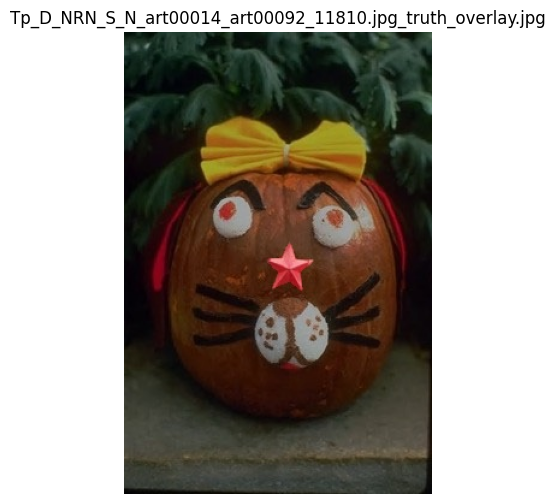

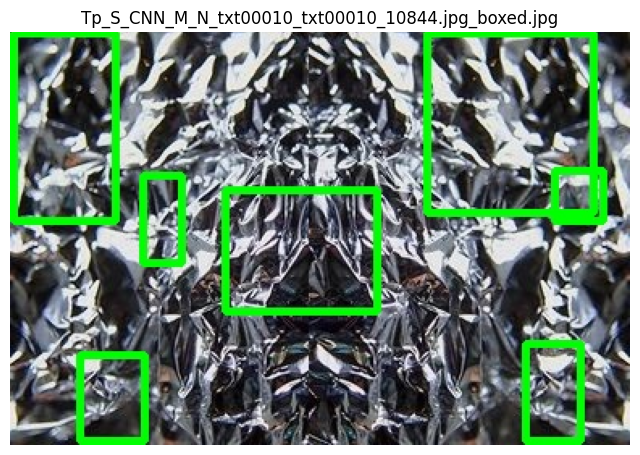

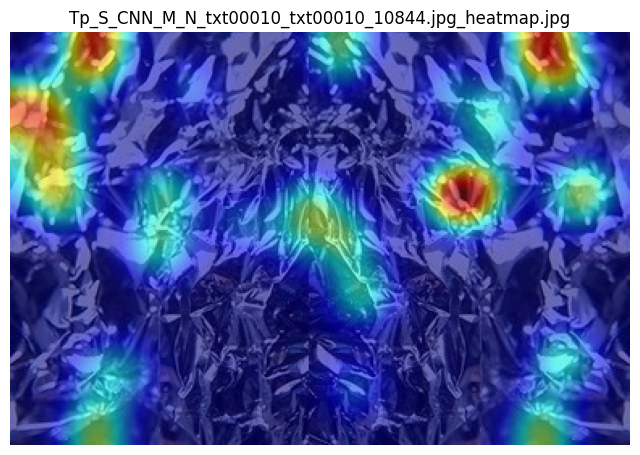


Batch run complete. Results are in: /mnt/data/casia_2_results_forged_tuned
Open metrics_summary.csv to inspect all numerical outputs.


In [32]:
import os
import io
import sys
import time
import zipfile
import glob
import math
import shutil
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from scipy.ndimage import gaussian_filter

# --- New Import ---
import kagglehub

# -------------------------------
# Configuration
# -------------------------------
OUT_DIR = '/mnt/data/casia_2_results_forged_tuned'
MAX_IMAGES_TO_PROCESS = 20     # Set to None to run on all *forged* images
SAMPLE_DISPLAY = 20            # how many sample results to display at the end

# --- TUNED HYPERPARAMETERS ---
SIFT_RATIO = 0.70              # Lowe ratio (relaxed from 0.7)
DBSCAN_EPS = 50               # clustering spatial radius (increased from 40)
DBSCAN_MIN_SAMPLES = 3         # min cluster size (decreased from 5)
# --- END OF TUNING ---

HEATMAP_SIGMA = 15             # gaussian blur for heatmap
MAX_MATCHES_DRAW = 100

os.makedirs(OUT_DIR, exist_ok=True)

# -------------------------------
# Utility functions
# -------------------------------

def unzip_dataset(zip_path, extract_to):
    if not os.path.exists(zip_path):
        raise FileNotFoundError(f"Zip file not found: {zip_path}")
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(extract_to)
    print(f"Extracted zip to: {extract_to}")


def show(img, title=None, inline=True, figsize=(10,8)):
    # Convenience plotting for Colab
    if img is None:
        print(f"Image is None: {title}")
        return
    plt.figure(figsize=figsize)
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    if title: plt.title(title)
    plt.axis('off')
    plt.show()


def load_image(path):
    img = cv2.imread(path)
    if img is None:
        raise IOError(f"Failed to load image: {path}")
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img, gray

# SIFT extraction
def extract_sift_features(gray_img):
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray_img, None)
    return kp, des

# Self-matching with FLANN and k=3 logic (as provided)
def match_features(kp, des, ratio_threshold=SIFT_RATIO):
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=4)
    search_params = dict(checks=40)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des, des, k=3)
    good_matches = []
    pts = []
    if len(matches) == 0:
        return good_matches, np.array(pts)
    for match_list in matches:
        if len(match_list) < 3:
            continue
        m, n, p = match_list
        # ensure first is self match
        if m.trainIdx != m.queryIdx:
            continue
        # ratio test between n and p (copy vs noise)
        if n.distance < ratio_threshold * p.distance:
            good_matches.append(n)
            # store the coordinates of matched keypoint (from queryIdx)
            pts.append(kp[n.queryIdx].pt)
    return good_matches, np.array(pts)

# Clustering
def cluster_matched_points(pts, eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES):
    if pts.shape[0] < min_samples:
        return np.array([]), set()
    clusterer = DBSCAN(eps=eps, min_samples=min_samples).fit(pts)
    labels = clusterer.labels_
    unique_clusters = set(labels)
    unique_clusters.discard(-1)
    return labels, unique_clusters

# Draw bounding boxes for clusters
def draw_bounding_boxes(image, pts, labels, unique_clusters, padding=10, color=(0,255,0), thickness=3):
    boxed = image.copy()
    boxes = []
    for cluster_id in unique_clusters:
        cluster_points = pts[labels == cluster_id]
        x_min, y_min = np.min(cluster_points, axis=0)
        x_max, y_max = np.max(cluster_points, axis=0)
        x_min, y_min, x_max, y_max = map(int, [x_min, y_min, x_max, y_max])
        x0, y0 = max(0, x_min-padding), max(0, y_min-padding)
        x1, y1 = min(boxed.shape[1]-1, x_max+padding), min(boxed.shape[0]-1, y_max+padding)
        cv2.rectangle(boxed, (x0,y0), (x1,y1), color, thickness)
        boxes.append((x0,y0,x1,y1))
    return boxed, boxes

# Create pixel-level predicted mask from boxes
def boxes_to_mask(boxes, shape):
    mask = np.zeros((shape[0], shape[1]), dtype=np.uint8)
    for (x0,y0,x1,y1) in boxes:
        cv2.rectangle(mask, (x0,y0), (x1,y1), 255, -1)
    return mask

# Heatmap from matched points
def matched_points_heatmap(pts, shape, sigma=HEATMAP_SIGMA):
    heat = np.zeros(shape[:2], dtype=np.float32)
    if pts.size == 0:
        return heat
    for (x,y) in pts.astype(int):
        if 0 <= y < heat.shape[0] and 0 <= x < heat.shape[1]:
            heat[y,x] += 1.0
    heat = gaussian_filter(heat, sigma=sigma)
    # normalize
    if heat.max() > 0:
        heat = heat / heat.max()
    return heat

# Overlay heatmap on image
def overlay_heatmap(img, heat, alpha=0.6):
    heat_uint8 = (heat * 255).astype(np.uint8)
    colored = cv2.applyColorMap(heat_uint8, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(colored, alpha, img, 1-alpha, 0)
    return overlay

# IoU, precision, recall at pixel level between predicted mask and truth mask
def compute_mask_metrics(pred_mask, truth_mask):
    if truth_mask is None:
        return None, None, None
    pred_bin = (pred_mask > 0).astype(np.uint8)
    truth_bin = (truth_mask > 0).astype(np.uint8)
    inter = np.logical_and(pred_bin, truth_bin).sum()
    union = np.logical_or(pred_bin, truth_bin).sum()
    pred_pos = pred_bin.sum()
    truth_pos = truth_bin.sum()
    iou = inter / union if union > 0 else 0.0
    precision = inter / pred_pos if pred_pos > 0 else 0.0
    recall = inter / truth_pos if truth_pos > 0 else 0.0
    return iou, precision, recall

# Attempt to find masks corresponding to an image (common CASIA naming heuristics)
def find_matching_mask(img_path, root_dir):
    # This function searches the entire root_dir, so it will find masks
    # in the 'Gt' folder even if the img_path is from the 'Tp' folder.
    base = Path(img_path).stem
    candidates = []
    for ext in ('*.bmp','*.png','*.tif','*.jpg'):
        candidates += glob.glob(os.path.join(root_dir, '**', base + '*mask*' + ext), recursive=True)
        candidates += glob.glob(os.path.join(root_dir, '**', base + '*gt*' + ext), recursive=True)
        candidates += glob.glob(os.path.join(root_dir, '**', base + ext), recursive=True)

    for c in candidates:
        if os.path.abspath(c) == os.path.abspath(img_path):
            continue
        try:
            m = cv2.imread(c, cv2.IMREAD_UNCHANGED)
            if m is None:
                continue
            if len(m.shape) == 2 or (len(np.unique(m)) < 20):
                return c
        except Exception:
            continue

    # --- ADDED DIAGNOSTIC ---
    # If we get here, no mask was found. This explains the 'NaN' values.
    print(f"Warning: No ground truth mask found for {Path(img_path).name}")
    return None

# -------------------------------
# Pipeline runner for a single image
# -------------------------------

def process_image(img_path, root_dir, out_dir, idx=None):
    start = time.time()
    filename = Path(img_path).name
    img, gray = load_image(img_path)

    kp, des = extract_sift_features(gray)
    num_kp = 0 if kp is None else len(kp)

    metrics = {
        'filename': filename,
        'num_keypoints': num_kp,
        'num_good_matches': 0,
        'num_clusters': 0,
        'avg_cluster_size': 0.0,
        'time_s': 0.0,
        'iou': None,
        'precision': None,
        'recall': None
    }

    if des is None or len(des) < 3:
        metrics['time_s'] = time.time() - start
        print(f"Skipping matching for {filename}: not enough descriptors")
        return metrics

    # Using the tuned SIFT_RATIO
    good_matches, pts = match_features(kp, des, ratio_threshold=SIFT_RATIO)
    metrics['num_good_matches'] = len(good_matches)

    # draw keypoints
    kp_img = cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    kp_path = os.path.join(out_dir, f"{filename}_keypoints.jpg")
    cv2.imwrite(kp_path, kp_img)

    # draw top matches
    try:
        match_vis = cv2.drawMatches(img, kp, img, kp, good_matches[:MAX_MATCHES_DRAW], None,
                                    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        match_path = os.path.join(out_dir, f"{filename}_matches.jpg")
        cv2.imwrite(match_path, match_vis)
    except Exception:
        match_path = None

    # Using the tuned DBSCAN_EPS and DBSCAN_MIN_SAMPLES
    labels, unique_clusters = cluster_matched_points(pts, eps=DBSCAN_EPS, min_samples=DBSCAN_MIN_SAMPLES)
    metrics['num_clusters'] = len(unique_clusters)
    cluster_sizes = []
    if len(unique_clusters) > 0:
        for cid in unique_clusters:
            cluster_sizes.append(np.sum(labels==cid))
        metrics['avg_cluster_size'] = float(np.mean(cluster_sizes))

    # draw bounding boxes
    boxed_img, boxes = draw_bounding_boxes(img, pts, labels, unique_clusters)
    boxed_path = os.path.join(out_dir, f"{filename}_boxed.jpg")
    cv2.imwrite(boxed_path, boxed_img)

    # heatmap
    heat = matched_points_heatmap(pts, img.shape, sigma=HEATMAP_SIGMA)
    heat_overlay = overlay_heatmap(img, heat, alpha=0.55)
    heat_path = os.path.join(out_dir, f"{filename}_heatmap.jpg")
    cv2.imwrite(heat_path, heat_overlay)

    # predicted mask from boxes
    pred_mask = boxes_to_mask(boxes, img.shape)
    pred_mask_path = os.path.join(out_dir, f"{filename}_pred_mask.png")
    cv2.imwrite(pred_mask_path, pred_mask)

    # try locate ground truth mask
    mask_path = find_matching_mask(img_path, root_dir) # root_dir is the full dataset path
    truth_mask = None
    truth_overlay_path = None
    if mask_path is not None:
        m = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if m is not None:
            # ensure same size as image; if not, attempt resize
            if m.shape[:2] != pred_mask.shape[:2]:
                try:
                    m = cv2.resize(m, (pred_mask.shape[1], pred_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
                except Exception:
                    m = None
            if m is not None:
                truth_mask = (m > 127).astype(np.uint8) * 255
                truth_mask_path = os.path.join(out_dir, f"{filename}_truth_mask.png")
                cv2.imwrite(truth_mask_path, truth_mask)
                # overlay truth mask on image (red transparent)
                colored = img.copy()
                red = np.zeros_like(colored)
                red[:,:,2] = 255
                mask_colored = cv2.bitwise_and(red, red, mask=truth_mask)
                overlay_truth = cv2.addWeighted(colored, 0.7, mask_colored, 0.3, 0)
                truth_overlay_path = os.path.join(out_dir, f"{filename}_truth_overlay.jpg")
                cv2.imwrite(truth_overlay_path, overlay_truth)

    # compute pixel-level metrics
    iou, prec, rec = compute_mask_metrics(pred_mask, truth_mask)
    metrics['iou'] = iou
    metrics['precision'] = prec
    metrics['recall'] = rec

    metrics['time_s'] = time.time() - start

    # save a small JSON-like summary text for this image
    sum_txt = os.path.join(out_dir, f"{filename}_summary.txt")
    with open(sum_txt, 'w') as f:
        for k,v in metrics.items():
            f.write(f"{k}: {v}\n")

    return metrics

# -------------------------------
# Main batch processing
# -------------------------------

def run_on_dataset(dataset_path, out_dir=OUT_DIR, max_images=None):
    work_dir = "" # This will be the root directory to search for images

    if os.path.isfile(dataset_path) and dataset_path.endswith('.zip'):
        print("Input is a zip file. Extracting...")
        work_dir = os.path.join(out_dir, 'extracted')
        if os.path.exists(work_dir):
            print(f"Removing existing extracted folder: {work_dir}")
            shutil.rmtree(work_dir)
        os.makedirs(work_dir, exist_ok=True)
        unzip_dataset(dataset_path, work_dir)
    elif os.path.isdir(dataset_path):
        print("Input is a directory. Using it directly.")
        work_dir = dataset_path # Use the downloaded path directly
    else:
        raise ValueError(f"Invalid dataset path provided: {dataset_D_path}")

    print(f"Using dataset root directory: {work_dir}")

    # --- NEW LOGIC: Find and use only the Tampered ('Tp') directory ---
    tp_dirs = glob.glob(os.path.join(work_dir, '**', 'Tp'), recursive=True)

    if not tp_dirs:
        print(f"Error: Could not find the 'Tp' (Tampered) directory inside {work_dir}")
        print("Please check the dataset structure. We will try searching the root instead.")
        tp_search_path = work_dir
    else:
        tp_search_path = tp_dirs[0] # Use the first 'Tp' directory found
        print(f"Found Tampered images directory: {tp_search_path}")

    # Find image files *only* in the tampered directory path
    img_files = []
    for ext in ('*.jpg','*.png','*.bmp','*.tif', '*.jpeg'):
        img_files += glob.glob(os.path.join(tp_search_path, '**', ext), recursive=True)

    # Filter out files that are likely masks/GT by name heuristics
    filtered = []
    for p in img_files:
        name = Path(p).name.lower()
        if 'mask' in name or 'gt' in name or 'groundtruth' in name or 'label' in name:
            continue
        filtered.append(p)
    img_files = filtered

    print(f"Found {len(img_files)} candidate *forged* images.")
    if max_images is not None:
        img_files = img_files[:max_images]
        print(f"Processing a subset of {len(img_files)} images.")

    if not img_files:
        print("No forged images found to process.")
        return

    rows = []
    for i, img_path in enumerate(img_files):
        print(f"Processing [{i+1}/{len(img_files)}]: {Path(img_path).name}")
        try:
            metrics = process_image(img_path, work_dir, out_dir, idx=i)
            rows.append(metrics)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            continue

    # save metrics to CSV
    if not rows:
        print("No images were successfully processed.")
        return

    df = pd.DataFrame(rows)
    csv_path = os.path.join(out_dir, 'metrics_summary.csv')
    df.to_csv(csv_path, index=False)
    print(f"Saved metrics CSV: {csv_path}")

    # Print forgery-relevant metrics
    sample = df.head(SAMPLE_DISPLAY)
    print("\n=== FORGERY DETECTION METRICS (SAMPLE) ===")

    forgery_metrics_cols = [
        'filename',
        'num_good_matches',
        'num_clusters',
        'avg_cluster_size',
        'iou',
        'precision',
        'recall'
    ]
    sample_forgery_metrics = sample.reindex(columns=forgery_metrics_cols)

    # --- THIS BLOCK IS THE FIX ---
    # First, round all float columns to 4 decimal places
    sample_forgery_metrics = sample_forgery_metrics.round(4)

    # Now, print to markdown. It will use the rounded values
    print(sample_forgery_metrics.to_markdown(index=False))
    # --- END OF FIX ---

    # --------------------------------------------------------------------
    # Display sample visualizations inline
    # --------------------------------------------------------------------

    print("\n=== SAMPLE VISUALIZATIONS ===")
    displayed = 0
    for fname in sample['filename'].tolist():
        boxed = os.path.join(out_dir, f"{fname}_boxed.jpg")
        heat = os.path.join(out_dir, f"{fname}_heatmap.jpg")
        truth = os.path.join(out_dir, f"{fname}_truth_overlay.jpg") # Show truth overlay too

        # Display Boxed, Heatmap, and Ground Truth (if found)
        for p in (boxed, heat, truth):
            if os.path.exists(p):
                show(cv2.imread(p), title=os.path.basename(p), figsize=(8,6))
                displayed += 1
                if displayed >= SAMPLE_DISPLAY*2: # Limit total plots
                    break
        if displayed >= SAMPLE_DISPLAY*2:
            break

    print("\nBatch run complete. Results are in:", out_dir)
    print("Open metrics_summary.csv to inspect all numerical outputs.")

# -------------------------------
# If run as script
# -------------------------------

if __name__ == '__main__':

    try:
        print("Downloading CASIA 2.0 dataset via Kaggle Hub...")
        dataset_path = kagglehub.dataset_download("divg07/casia-20-image-tampering-detection-dataset")

        print(f"Dataset downloaded/found at: {dataset_path}")

        # Run the pipeline on the downloaded path
        run_on_dataset(dataset_path, OUT_DIR, max_images=MAX_IMAGES_TO_PROCESS)

    except ImportError:
        print("\n--- ERROR ---")
        print("kagglehub library not found. Please install it:")
        print("!pip install kagglehub")
        print("(If in a script, run: pip install kagglehub)")
    except Exception as e:
        print(f"\nAn error occurred: {e}")
        print("Please ensure you are authenticated with Kaggle.")
        print("You may need to set up your kaggle.json API token.")
        print("See: https://www.kaggle.com/docs/api")